# Team 7 `Stroke Detection`

|Name|ID|
|----|--|
|Ahmed Osama Noaman|19P7926|
|Ahmed Gamil Fathy|19P4664|
|Mohamed Ehab Mansour|19P5241|
|Maria Mourad Elia|19P4894|
|Morcous Wael William|19P8211|

In [134]:
import pandas as pd
import numpy as np
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, SimpleImputer
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import BayesianRidge
from sklearn.preprocessing import MinMaxScaler, KBinsDiscretizer
from missingno import matrix
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import ListedColormap
from scipy.stats import norm
import seaborn as sns
from scipy.stats import zscore, pointbiserialr
import matplotlib as mpl
from apyori import apriori
mpl.rcParams['figure.dpi'] = 250
%matplotlib inline

# Preprocessing

### 1. Understanding the Data

| Name                | Data Type           | Possible Values                                                           |
|---------------------|---------------------|---------------------------------------------------------------------------|
| id                  | Numerical(int)      | Random Number                                                             |
| gender              | Categorical         | `Male` or `Female`                                                        |
| age                 | Numerical(int)      | Continuous Range                                                          |
| hypertension        | Numerical(bin)      | Binary (`0` or `1`)                                                       |
| heart_disease       | Numerical(bin)      | Binary (`0` or `1`)                                                       |
| ever_married        | Categorical         | `Yes` or `No`                                                             |
| work_type           | Categorical         | `Private`, `Self-employed`, `Govt_job`, `Never_worked`, `children`        |
| Residence_type      | Categorical         | `Urban`, `Rural`                                                          |
| avg_glucose_level   | Numerical(float)    | Continuous Range                                                          |
| bmi                 | Numerical(float)    | Continuous Range, Missing Values(`N/A`)                                   |
| smoking_status      | Categorical         | `Smokes`, `Formerly smoked`, `Never smoked`, Missing Values(`Unknown`)    |

In [135]:
rawTrainingData = pd.read_csv('Data\healthcare-dataset-stroke-data.csv', delimiter = ',')
print('The Stroke data has {0} rows and {1} columns'.format(rawTrainingData.shape[0],rawTrainingData.shape[1]))

The Stroke data has 5110 rows and 12 columns


In [136]:
rawTrainingData.describe()

,id,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke
count,5110.000000,5110.000000,5110.000000,5110.000000,5110.000000,4909.000000,5110.000000
mean,36517.829354,43.226614,0.097456,0.054012,106.147677,28.893237,0.048728
std,21161.721625,22.612647,0.296607,0.226063,45.283560,7.854067,0.215320
min,67.000000,0.080000,0.000000,0.000000,55.120000,10.300000,0.000000
25%,17741.250000,25.000000,0.000000,0.000000,77.245000,23.500000,0.000000
50%,36932.000000,45.000000,0.000000,0.000000,91.885000,28.100000,0.000000
75%,54682.000000,61.000000,0.000000,0.000000,114.090000,33.100000,0.000000
max,72940.000000,82.000000,1.000000,1.000000,271.740000,97.600000,1.000000


In [137]:
rawTrainingData['stroke'].value_counts()

0    4861
1     249
Name: stroke, dtype: int64

In [138]:
rawTrainingData.groupby('stroke').describe()

id                                                                \
         count          mean           std    min      25%      50%      75%   
stroke                                                                         
0       4861.0  36487.236371  21120.133386   67.0  17762.0  36958.0  54497.0   
1        249.0  37115.068273  21993.344872  210.0  17013.0  36706.0  56669.0   

                    age             ... avg_glucose_level             bmi  \
            max   count       mean  ...               75%     max   count   
stroke                              ...                                     
0       72940.0  4861.0  41.971545  ...            112.83  267.76  4700.0   
1       72918.0   249.0  67.728193  ...            196.71  271.74   209.0   

                                                           
             mean       std   min   25%   50%   75%   max  
stroke                                                     
0       28.823064  7.908287  10.3  23.4  28.0  33.1  97.6  
1       30.471292  6.329452  16.9  26.4  29.7  33.7  56.6  

[2 rows x 48 columns]

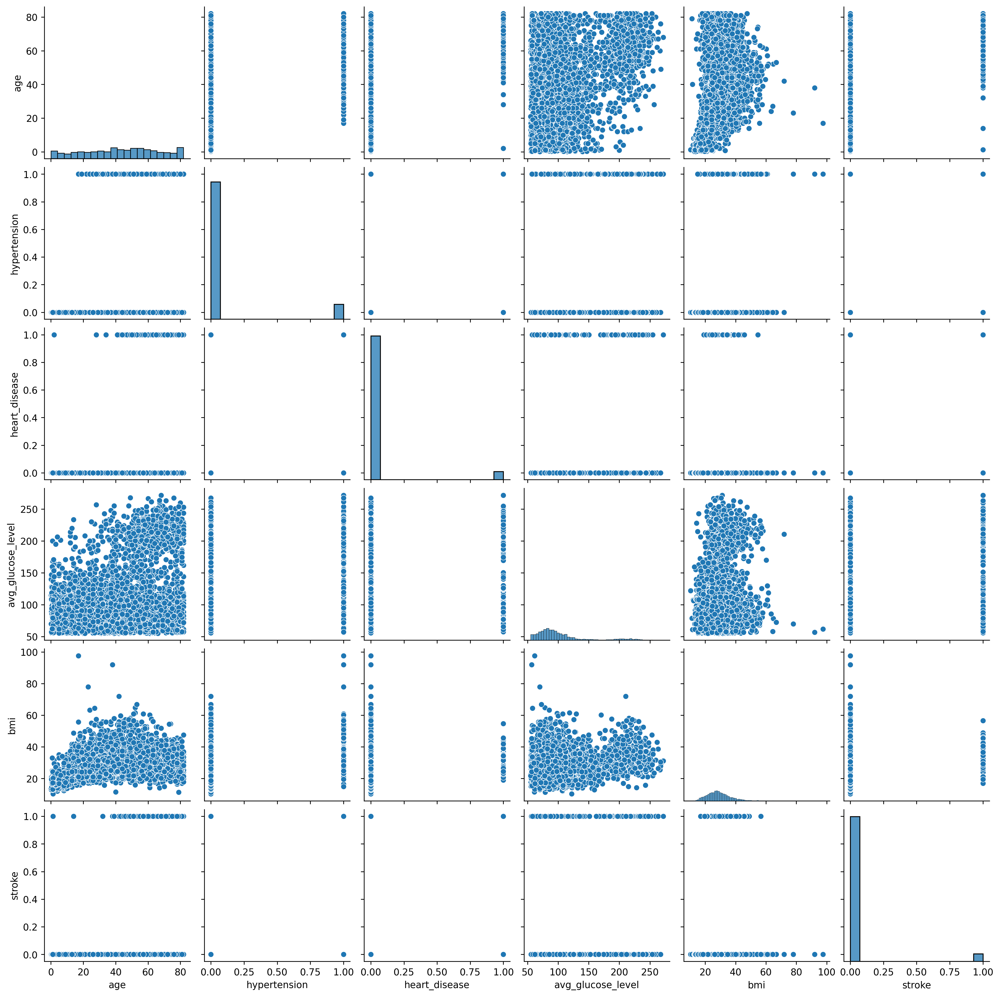

In [139]:
sns.pairplot(rawTrainingData.drop(columns=['id']))



### 2. Missing Data Filling

The `bmi` and `smoking_status` columns both have missing values of `N/A` and `Unknown` respectively.





- Percentage of missing values for each column:
________________________________________________
smoking_status       0.302153
bmi                  0.039335
id                   0.000000
gender               0.000000
age                  0.000000
hypertension         0.000000
heart_disease        0.000000
ever_married         0.000000
work_type            0.000000
Residence_type       0.000000
avg_glucose_level    0.000000
stroke               0.000000
dtype: float64

Missingness Matrix:


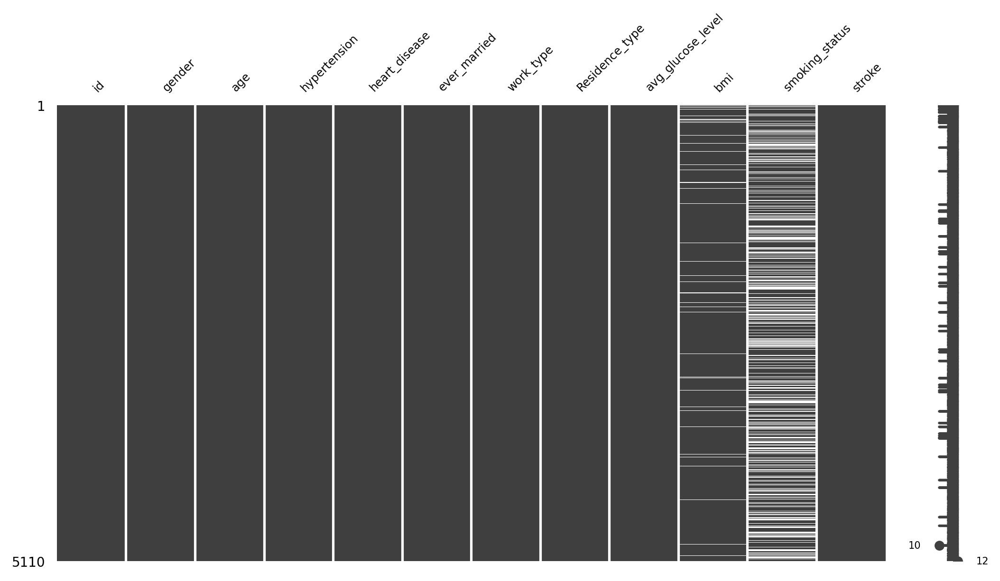

In [140]:

rawTrainingData['smoking_status'].replace('Unknown', np.NaN, inplace=True)
print(f'\n- Percentage of missing values for each column:')
print('________________________________________________')
print(rawTrainingData.isnull().mean().sort_values(ascending=False))
print('\nMissingness Matrix:')
matrix(rawTrainingData, fontsize=7, figsize=(10, 5))
plt.show()

#### 1.1 Filling BMI
Analyzing `bmi`, we notice that it is normally distributed.

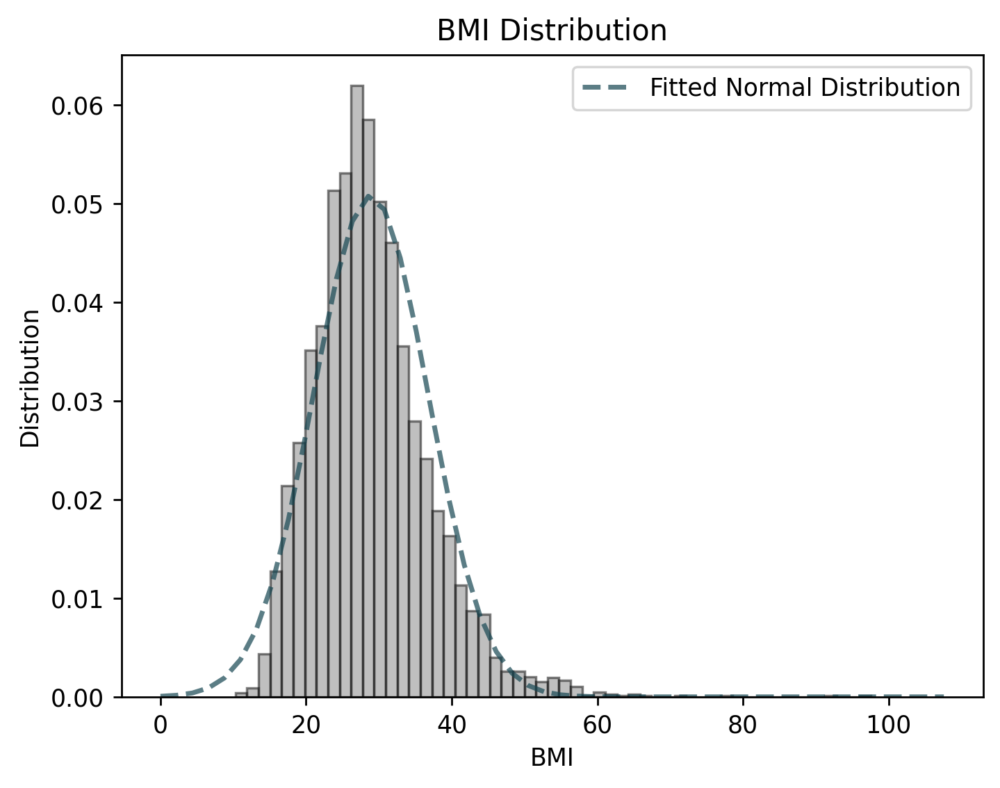

In [141]:
filledTrainingData = rawTrainingData.copy(deep=True)

bmiData = filledTrainingData['bmi'].dropna()
plt.hist(bmiData, bins=55, density=True, alpha=0.5, color='grey', edgecolor='black')

mu, std = bmiData.mean(), bmiData.std()
x = np.linspace(0, bmiData.dropna().max()+10)
p = norm.pdf(x, mu, std)

plt.plot(x, p, linestyle='--', linewidth=2, color='#164652', alpha=0.7)
plt.legend(['Fitted Normal Distribution'], loc='best')
plt.xlabel('BMI')
plt.ylabel('Distribution')
plt.title('BMI Distribution')

plt.show()

Since `bmi` follows a normal distribution, and is linearly related to fields such as Age, Hypertentsion, Heart Disease, and Average Glucose Level; we can use a Bayesian Ridge regressor to predict the missing values somewhat accurately.

In [142]:
features = ['age', 'hypertension', 'heart_disease', 'avg_glucose_level']
bmiImputer = IterativeImputer(estimator=BayesianRidge(), sample_posterior=True, max_iter=30, missing_values=np.nan, random_state=np.random.randint(100))
filledTrainingData[features + ['bmi']] = bmiImputer.fit_transform(filledTrainingData[features + ['bmi']])

print(f"Remaining missing values in BMI: {filledTrainingData['bmi'].isnull().sum()}")

Remaining missing values in BMI: 0


#### 1.2 Filling Smoking Status

For simplicity's sake, we filled the missing values with the mode of the data.

In [143]:
smokingStatusImputer = SimpleImputer(strategy='most_frequent')
filledTrainingData[['smoking_status']] = smokingStatusImputer.fit_transform(filledTrainingData[['smoking_status']])

print(f"Remaining missing values in Smoking Status: {filledTrainingData['smoking_status'].isnull().sum()}")

Remaining missing values in Smoking Status: 0



- Percentage of missing values for each column:
________________________________________________
id                   0.0
gender               0.0
age                  0.0
hypertension         0.0
heart_disease        0.0
ever_married         0.0
work_type            0.0
Residence_type       0.0
avg_glucose_level    0.0
bmi                  0.0
smoking_status       0.0
stroke               0.0
dtype: float64


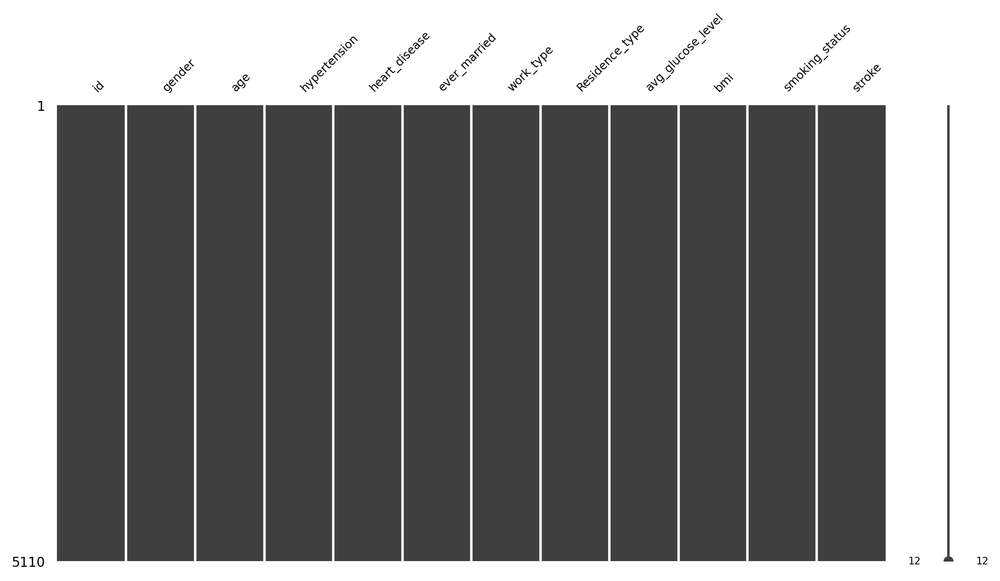

In [144]:
print(f'\n- Percentage of missing values for each column:')
print('________________________________________________')
print(filledTrainingData.isnull().mean().sort_values(ascending=False))

matrix(filledTrainingData, fontsize=7, figsize=(10, 5))
plt.show()

### 3. Outlier Detection

The features `bmi` and `avg_glucose_level` are the only continuous features which could logically hold an outlier, as age doesn't really hold the possibility for an outlier.

We explore the outlier detection using two methods: Box Plotting and Z-Score analysis.

#### 3.1 Box Plots

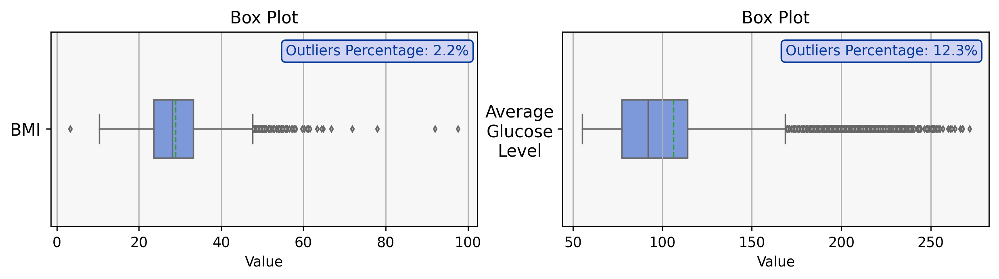

In [145]:
columns = ['bmi', 'avg_glucose_level']

fig, axs = plt.subplots(1, len(columns), figsize=(12, 2.5))
for i, col in enumerate(columns):
    sns.boxplot(data=filledTrainingData[[col]], ax=axs[i], orient='h', width=0.3, color='#6f92e9', fliersize=2, linewidth=1, showmeans=True, meanline=True, flierprops=dict(markersize=3, markerfacecolor='#b7b5b9'))

    desc = filledTrainingData[col].describe()
    q1 = desc['25%']
    q3 = desc['75%']
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    outliers = filledTrainingData[(filledTrainingData[col] < lower) | (filledTrainingData[col] > upper)]
    outlier_pct = 100 * len(outliers) / len(filledTrainingData)

    axs[i].text([78, 222.5][i], -0.4, f'Outliers Percentage: {outlier_pct:.1f}%', color='#003898', ha='center', va='center', bbox=dict(facecolor='#d2d4f4', edgecolor='#003898', boxstyle='round'))

    axs[i].set_title('Box Plot')
    axs[i].set_xlabel('Value')
    axs[i].set_ylabel('')
    axs[i].set_facecolor('#f7f7f7')
    axs[i].grid(visible=True, axis='x')

axs[0].set_yticklabels(['BMI'], fontsize=12)
axs[1].set_yticklabels(['Average\nGlucose\nLevel'], fontsize=12, ha='center')
axs[1].tick_params(axis='y', pad=27)

plt.show()

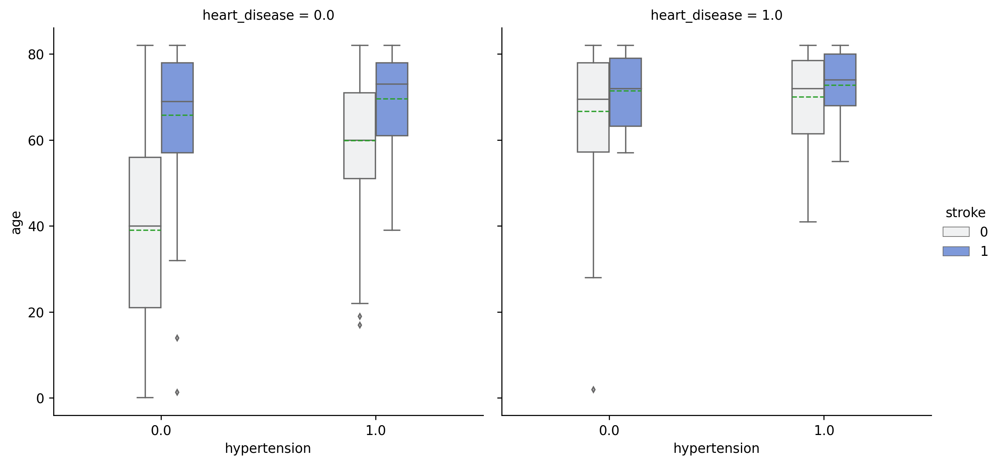

In [146]:
sns.catplot(
    data=filledTrainingData, kind ='box',
    y='age', x='hypertension', hue='stroke', col='heart_disease',
    width=0.3, color='#6f92e9', fliersize=2, linewidth=1, showmeans=True, meanline=True, flierprops=dict(markersize=3, markerfacecolor='#b7b5b9')
)


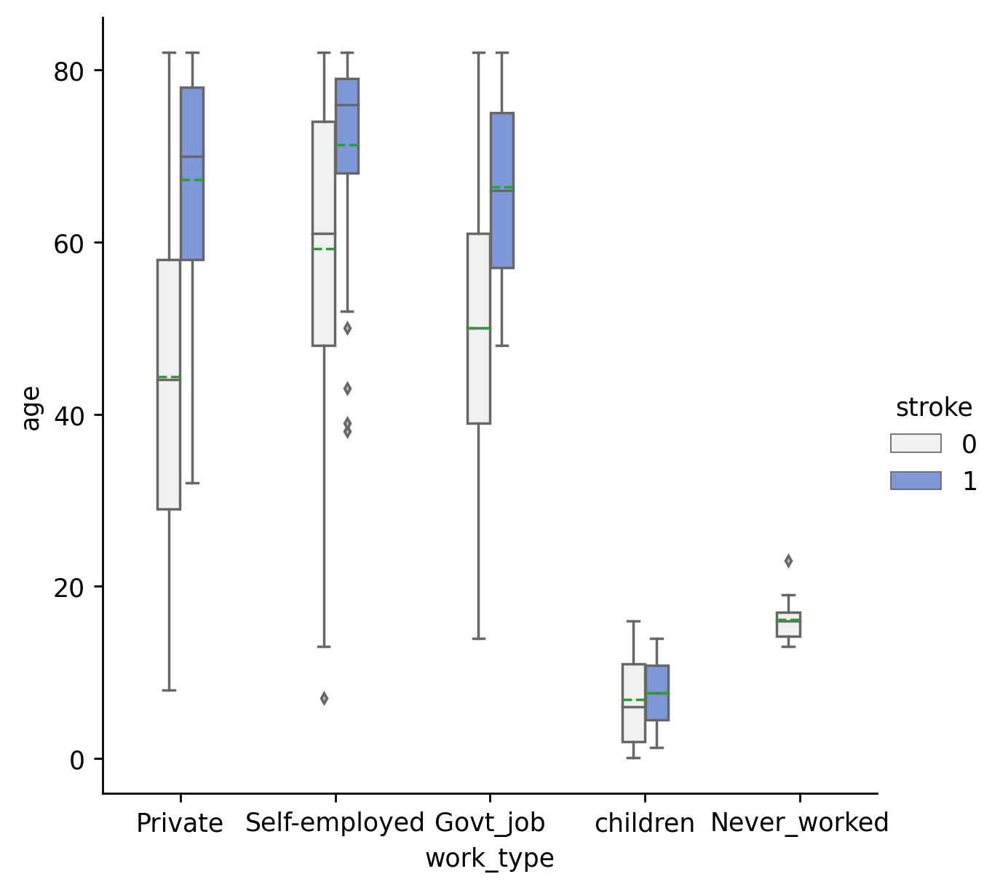

In [147]:
sns.catplot(
    data=filledTrainingData, kind ='box',
    x='work_type', y='age', 
    hue='stroke', width=0.3, color='#6f92e9', fliersize=2, linewidth=1, showmeans=True, meanline=True, flierprops=dict(markersize=3, markerfacecolor='#b7b5b9') 
)

#### 3.2 Z-Score Analysis

We used a scatter plot between each data entry of `bmi` and `avg_glucose_level` and their Z-Scores for those respective values, then used a separator to separate Z-Scores into 3 sections (Above 3, between 3 and -3, below -3) and as such we could determine the outliers.

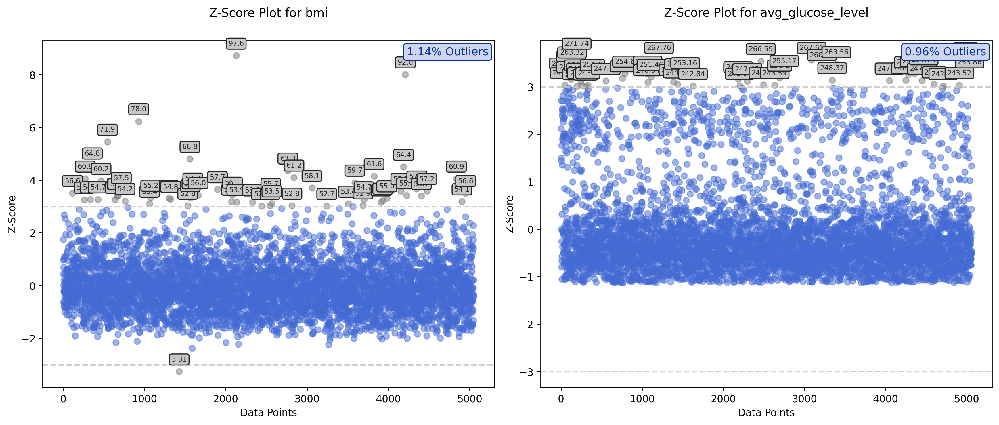

In [148]:
def plot_zscores(data, column_name, ax):
    zscores = pd.DataFrame(zscore(data[column_name].dropna()).tolist(), columns=['zscores'])
    z_outliers = zscores[(zscores['zscores'] > 3) | (zscores['zscores'] < -3)]
    z_normal = zscores[(zscores['zscores'] < 3) & (zscores['zscores'] > -3)]
    
    # plot z-score values with lines at 3 and -3 z scores
    ax.axhline(y=3, color='#c7c7c7', linestyle='--', alpha=0.85)
    ax.axhline(y=-3, color='#c7c7c7', linestyle='--', alpha=0.85)
    ax.scatter(range(len(z_normal['zscores'])), z_normal['zscores'], color='#446ad4', alpha=0.5)
    ax.scatter(z_outliers.index.values.tolist(), z_outliers['zscores'], color='#7a7a7a', alpha=0.5)

    outliers = []
    for i, z in enumerate(zscores['zscores']):
        if abs(z) > 3:
            ax.annotate(
                str(round(data[column_name].iloc[i], 2)),
                xy=(i, z),
                textcoords='offset points',
                xytext=(0,10),
                ha='center',
                color='#262626',
                bbox=dict(facecolor='#c7c7c7', edgecolor='#262626', boxstyle='round'),
                fontsize=7
            )
            outliers.append(z)

    z_outlier_percentage = (len(outliers) / len(data[column_name])) * 100

    ax.text(0.987, 0.98, f'{z_outlier_percentage:.2f}% Outliers', color='#003898', transform=ax.transAxes, ha='right', va='top',bbox=dict(facecolor='#d2d4f4', edgecolor='#003898', boxstyle='round'), fontsize=11)

    ax.set_xlabel('Data Points')
    ax.set_ylabel('Z-Score')
    ax.set_title(f'Z-Score Plot for {column_name}', y=1.05)

    return ax

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(14,6))

plot_zscores(filledTrainingData, 'bmi', ax=axs[0])
plot_zscores(filledTrainingData, 'avg_glucose_level', ax=axs[1])

plt.tight_layout()
plt.show()

### 4. Continuous Feature Discretization

To proceed with the continuous values of features `age`, `bmi`, and `avg_glucose_level`, it would be best do discretize their ranges to make them easier to deal with in plots for the future.

In [149]:
discretizedTrainingData = filledTrainingData.copy(deep=True)

age_discretizer = KBinsDiscretizer(n_bins=10, encode='ordinal', strategy='quantile')
discretizedTrainingData['age'] = age_discretizer.fit_transform(discretizedTrainingData[['age']])

bmi_discretizer = KBinsDiscretizer(n_bins=7, encode='ordinal', strategy='uniform')
discretizedTrainingData['bmi'] = bmi_discretizer.fit_transform(discretizedTrainingData[['bmi']])

glucose_discretizer = KBinsDiscretizer(n_bins=7, encode='ordinal', strategy='uniform')
discretizedTrainingData['avg_glucose_level'] = glucose_discretizer.fit_transform(discretizedTrainingData[['avg_glucose_level']])

print(discretizedTrainingData.head(4))

      id  gender  age  hypertension  heart_disease ever_married  \
0   9046    Male  8.0           0.0            1.0          Yes   
1  51676  Female  7.0           0.0            0.0          Yes   
2  31112    Male  9.0           0.0            1.0          Yes   
3  60182  Female  5.0           0.0            0.0          Yes   

       work_type Residence_type  avg_glucose_level  bmi   smoking_status  \
0        Private          Urban                5.0  2.0  formerly smoked   
1  Self-employed          Rural                4.0  2.0     never smoked   
2        Private          Rural                1.0  2.0     never smoked   
3        Private          Urban                3.0  2.0           smokes   

   stroke  
0       1  
1       1  
2       1  
3       1  


### 5. Discretized Feature Normalization

The next step is to use the discretized continuous features for normalization, as normalization can help with clustering as well as feature engineering for later when we need to train a model on the data.

The number of outliers is natural (Though large in the case of box plotting) as they fall within the expected min/max range of each respective variable for `bmi` and `avg_glucose_level` and as such will not be removed so as to not cause a loss of data.


In [150]:
normalizedTrainingData = discretizedTrainingData.copy()

columns_to_scale = ['age', 'bmi', 'avg_glucose_level']

scaler = MinMaxScaler()

scaled_columns = scaler.fit_transform(discretizedTrainingData[columns_to_scale])

for i, col in enumerate(columns_to_scale):
    normalizedTrainingData[col] = scaled_columns[:, i]

In [151]:
filledTrainingData.describe()

,id,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke
count,5110.000000,5110.000000,5110.000000,5110.000000,5110.000000,5110.000000,5110.000000
mean,36517.829354,43.226614,0.097456,0.054012,106.147677,28.934159,0.048728
std,21161.721625,22.612647,0.296607,0.226063,45.283560,7.877855,0.215320
min,67.000000,0.080000,0.000000,0.000000,55.120000,3.314103,0.000000
25%,17741.250000,25.000000,0.000000,0.000000,77.245000,23.600000,0.000000
50%,36932.000000,45.000000,0.000000,0.000000,91.885000,28.100000,0.000000
75%,54682.000000,61.000000,0.000000,0.000000,114.090000,33.200000,0.000000
max,72940.000000,82.000000,1.000000,1.000000,271.740000,97.600000,1.000000


### 6. Data Correlations

To explore the correlations between the features of the data, we can use a few different approaches, including:
1. Pearson Correlation Matrix
2. Point Biserial Correlation

We can also use famous algorithms such as `apriori`, `eclat` and `FP growth` to extract association rules from the data.

#### 6.1 Correlation Methods
##### 6.1.1 Pearson Correlation Matrix


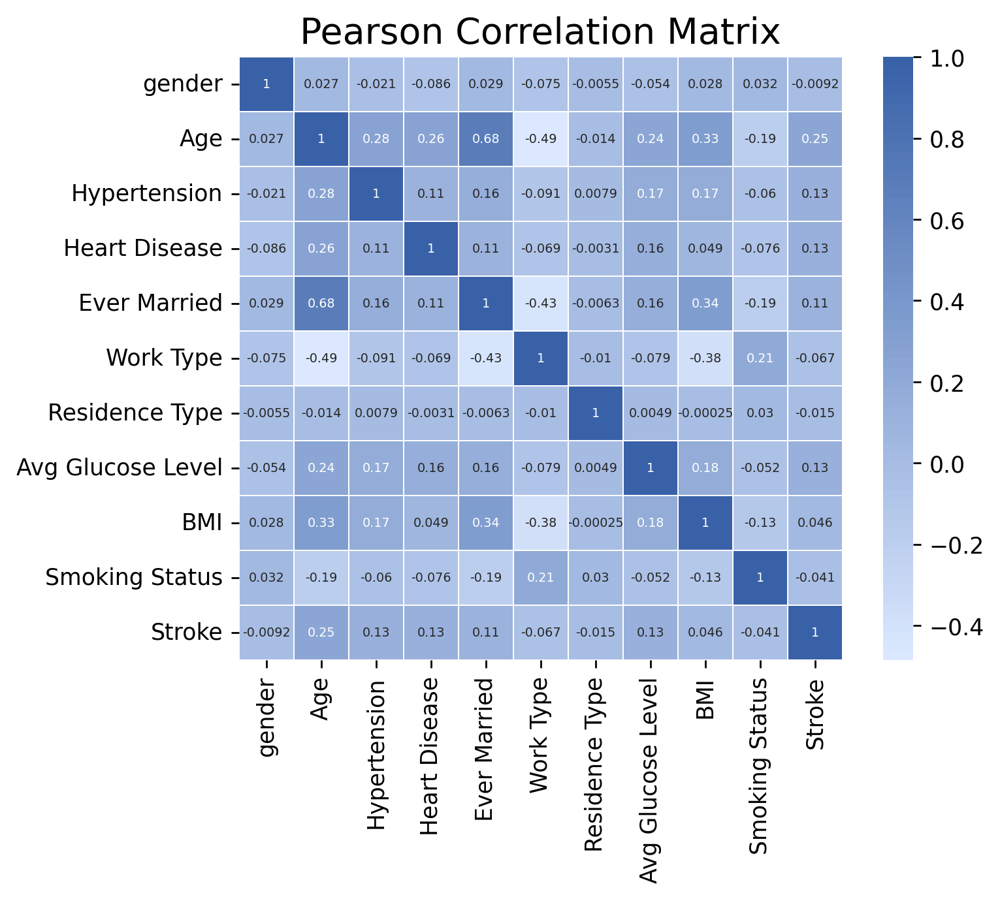

In [152]:
encodedTrainingData = filledTrainingData.copy()

encoded_gender = {'Male': 0, 'Female': 1, 'Other': 2}
encodedTrainingData['gender'] = encodedTrainingData['gender'].replace(encoded_gender)

encoded_ever_married = {'No': 0, 'Yes': 1}
encodedTrainingData['ever_married'] = encodedTrainingData['ever_married'].replace(encoded_ever_married)

encoded_work_type = {'Private': 0, 'Self-employed': 1, 'Govt_job': 2, 'Never_worked': 3, 'children': 4}
encodedTrainingData['work_type'] = encodedTrainingData['work_type'].replace(encoded_work_type)

encoded_residence_type = {'Urban': 0, 'Rural': 1}
encodedTrainingData['Residence_type'] = encodedTrainingData['Residence_type'].replace(encoded_residence_type)

encoded_smoking_status = {'smokes': 0, 'formerly smoked': 1, 'never smoked': 2}
encodedTrainingData['smoking_status'] = encodedTrainingData['smoking_status'].replace(encoded_smoking_status)

corr = encodedTrainingData.drop(columns=['id']).corr(method='pearson')
corr = corr.rename(columns={
    'age': 'Age',
    'hypertension': 'Hypertension',
    'heart_disease': 'Heart Disease',
    'ever_married': 'Ever Married',
    'work_type': 'Work Type',
    'Residence_type': 'Residence Type',
    'avg_glucose_level': 'Avg Glucose Level',
    'bmi': 'BMI',
    'smoking_status': 'Smoking Status',
    'stroke': 'Stroke'
})
colors = ['#DBE8FF', '#3861A8']
cmap_name = 'my_custom_cmap'
cm = LinearSegmentedColormap.from_list(cmap_name, colors, N=64)

sns.heatmap(corr, annot=True, cmap=cm, linewidths=0.5, square=True, annot_kws={'fontsize': 5.5}, yticklabels=corr.columns)
plt.title('Pearson Correlation Matrix', fontsize=16)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show() 

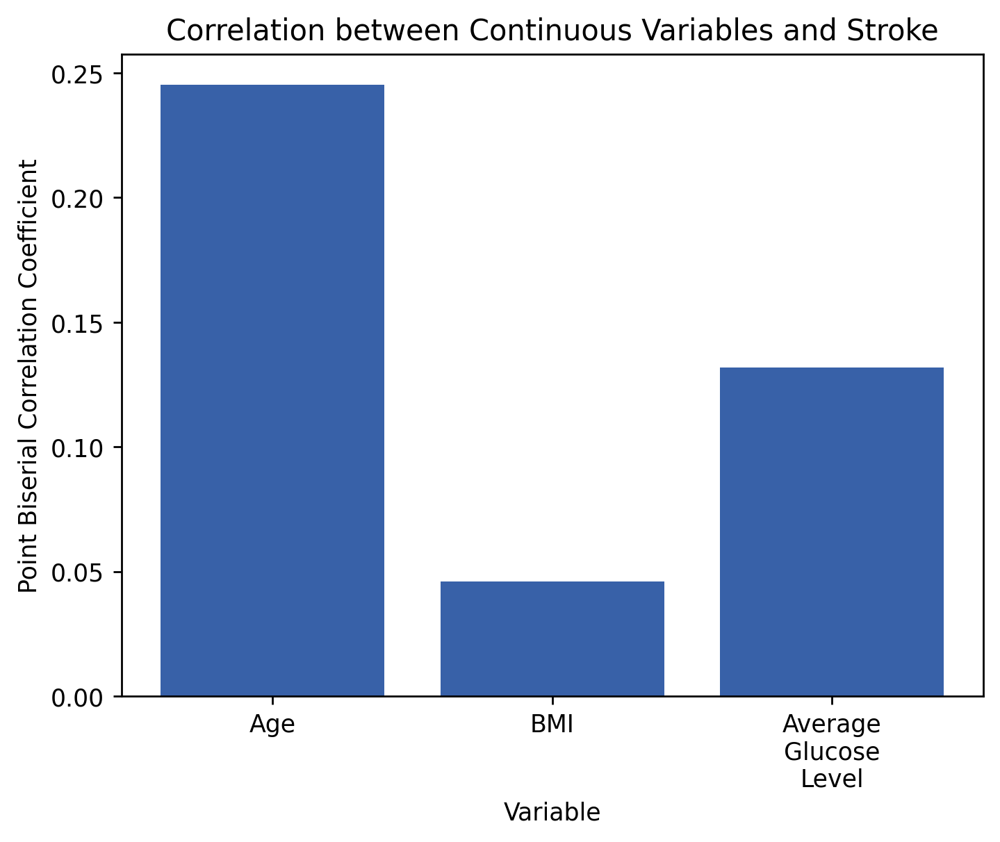

In [153]:
age_corr, age_pvalue = pointbiserialr(filledTrainingData['age'], filledTrainingData['stroke'])
bmi_corr, bmi_pvalue = pointbiserialr(filledTrainingData['bmi'], filledTrainingData['stroke'])
glucose_corr, glucose_pvalue = pointbiserialr(filledTrainingData['avg_glucose_level'], filledTrainingData['stroke'])

plt.bar(['Age', 'BMI', 'Average\nGlucose\nLevel'], [age_corr, bmi_corr, glucose_corr], color='#3861A8')

plt.xlabel('Variable')
plt.ylabel('Point Biserial Correlation Coefficient')
plt.title('Correlation between Continuous Variables and Stroke')

plt.show()


From these two charts it is obvious that `stroke` is most dependent on the  `age` of the person in relation to other variables as it has the highest Pearson and biserial coefficients. 

A Pearson correlation coefficient of $0.25$ between `age` and `stroke` indicates a weak positive correlation. This means that there is a small, positive relationship between `age` and the likelihood of having a `stroke`. As `age` increases, the likelihood of having a `stroke` also tends to increase, but the correlation is not very strong.

We can explore this correlation further with a simple scatter plot.

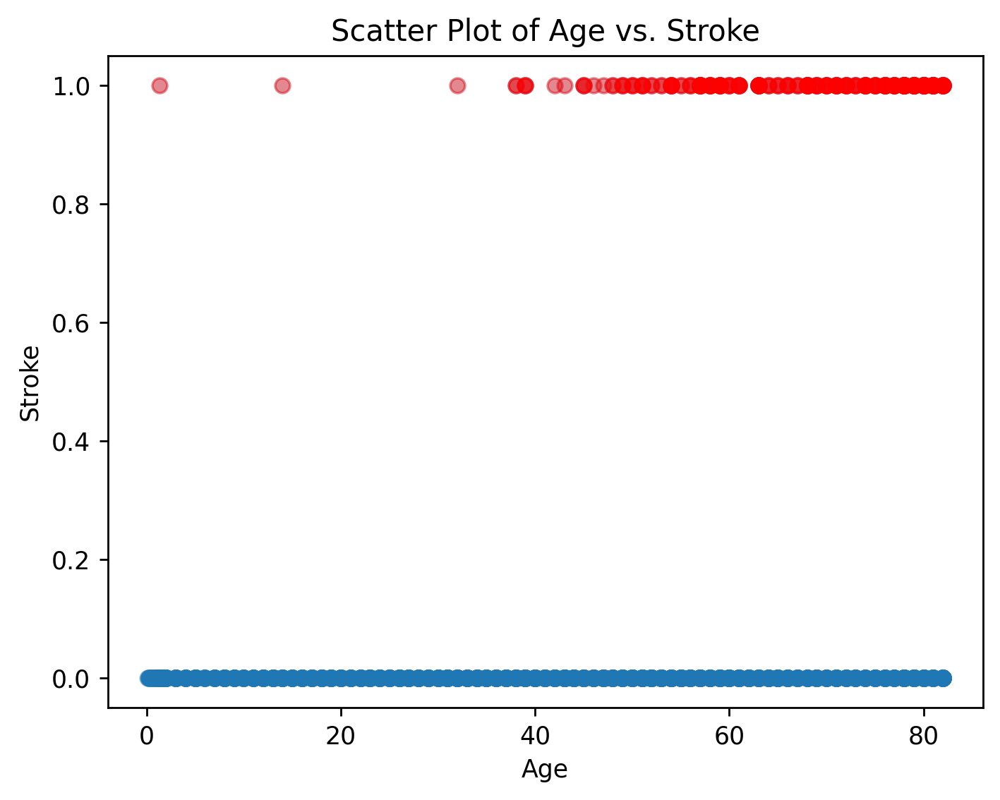

In [154]:
age = filledTrainingData['age']
stroke = filledTrainingData['stroke']

positive_stroke = (stroke == 1)
plt.scatter(age, stroke, alpha=0.2)
plt.scatter(age[positive_stroke], stroke[positive_stroke], color='red', alpha=0.4)

plt.xlabel('Age')
plt.ylabel('Stroke')
plt.title('Scatter Plot of Age vs. Stroke')

plt.show()

We can see that strokes tend to happen more often at older ages than younger ones.

Taking a look at side correlations, we see a high correlation between `age` and `ever_married` of $0.68$ which makes sense because the older a person is the more likely they have gotten married.

In [ ]:
row, col = encodedTrainingData.shape
tuples = []
for i in range(0, row):
    tuple = []
    for j in range(0, col):
        val = encodedTrainingData.values[i, j]
        if str(val) != 'nan':
            tuple.append(val)
    tuples.append(tuple)
    tupleslist = encodedTrainingData.values.tolist()
    
Association_Rules = apriori(tuples, min_support = 0.005, min_confidence = 0.2, min_length = 1)
Association_Results = list(Association_Rules)
print("{} derived relations".format(len(Association_Results)))

for item in Association_Results:
    print(item)
    pair = item[0]
    items = [y for y in pair]
    print("Frequent Itemsets" + str(items), '\n')
    print("Support" + str(item[1]), '\n')
    if(len(pair) > 1):
        for rule in item[2]:
            print("Rule: " + str(rule[0]) + "->" + str(rule[1]) , "\n")
            print("Confidence: " + str(rule[2]), "\n")
            print("Lift: " + str(rule[3]), "\n")
            print("_______________________________________________________________________")

767 derived relations
RelationRecord(items=frozenset({0.0}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({0.0}), confidence=1.0, lift=1.0)])
Frequent Itemsets[0.0] 

Support1.0 

RelationRecord(items=frozenset({1.0}), support=0.9373776908023483, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({1.0}), confidence=0.9373776908023483, lift=1.0)])
Frequent Itemsets[1.0] 

Support0.9373776908023483 

RelationRecord(items=frozenset({2.0}), support=0.7221135029354208, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({2.0}), confidence=0.7221135029354208, lift=1.0)])
Frequent Itemsets[2.0] 

Support0.7221135029354208 

RelationRecord(items=frozenset({0.0, 1.0}), support=0.9373776908023483, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({0.0, 1.0}), confidence=0.9373776908023483, lift=1.0), OrderedStatistic(items_base=frozenset({0.0}), items_add=frozenset({1.0}), confidence=0.9373776908023483, lift=1.0), OrderedStatistic(items_base=frozenset({1.0}), items_add=frozenset({0.0}), confidence=1.0, lift=1.0)])
Frequent Itemsets[0.0, 1.0] 

Support0.9373776908023483 

Rule: frozenset()->frozenset({0.0, 1.0}) 

Confidence: 0.9373776908023483 
...

Lift: 1.0 

#  Classifiaction 

In [156]:
# General Imports
from sklearn.model_selection import train_test_split
from imblearn.combine import SMOTEENN
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, adjusted_rand_score
from scipy.spatial.distance import cdist
from sklearn.metrics import accuracy_score
import matplotlib.cm as cm
import networkx as nx
import warnings
warnings.filterwarnings('ignore')


### 1. Splitting Data Into Training and Testing sets.
We are going to split the dataset into two sets, a training set and a test set. This is done at this stage as the next stage is going to be oversampling, and we don't want to oversample test data so as to not have an inaccurate accuracy measure when predicting using classifiers. The splitting ratio will be $0.8$

In [157]:
noIdEncodedTrainingData = encodedTrainingData.drop(columns=['id'])
target = noIdEncodedTrainingData['stroke']
predictors = noIdEncodedTrainingData.drop('stroke', axis=1)
x_train, x_test, y_train, y_test = train_test_split(predictors,target, train_size=0.8,random_state= 42, stratify = target.values)

display(x_train.shape)
display(y_train.shape)
display(x_test.shape)
display(y_test.shape)

(4088, 10)

(4088,)

(1022, 10)

(1022,)

### 2. Synthetic Minority Oversampling Technique (SMOTE)

`SMOTE`, which stands for `Synthetic Minority Over-sampling Technique`, is a widely used algorithm in the field of machine learning for addressing the challenge of imbalanced datasets.

Imbalanced datasets occur when the number of instances in one class significantly outweighs the other, leading to biased models that tend to favor the majority class, and such is the case in our dataset, since the percentage of rows that have a stroke value of 1 are only `4.87%`. SMOTE aims to mitigate this issue by generating synthetic examples for the minority class (in this case stroke = 1), thereby balancing the dataset.

The algorithm works by identifying the minority class instances and creating synthetic samples by interpolating between neighboring instances. By doing so, SMOTE increases the representation of the minority class, enabling the classifier to learn from a more balanced and representative dataset.

This technique helps to enhance the performance of machine learning models by reducing the bias towards the majority class and improving overall predictive accuracy, particularly in scenarios where the minority class is of greater interest, such is the case because correctly predecting that a person would have a stroke is highly critical.

In [158]:
X = noIdEncodedTrainingData.drop('stroke', axis=1)
y = noIdEncodedTrainingData['stroke']
oversample = SMOTEENN(random_state=42)
X_sm, y_sm = oversample.fit_resample(x_train,y_train)

print('Data shapes before oversampling were {0} and {1}'.format(x_train.shape, y_train.shape))
print('Data shapes after oversampling are {0} and {1}'.format(X_sm.shape, y_sm.shape))

print('Class distribution after oversampling:')
print(y_sm.value_counts())


Data shapes before oversampling were (4088, 10) and (4088,)
Data shapes after oversampling are (6570, 10) and (6570,)
Class distribution after oversampling:
1    3629
0    2941
Name: stroke, dtype: int64


#### 2.1 Splitting the overampled data. this step will be used in the classification phase

Splitting the oversampled dataset into training and testing sets again is necessary to prevent overfitting of the model and also to prevent data Leakage.

Data leakage occurs when information from the testing set is inadvertently used during model training, leading to overly optimistic performance estimates.

In [159]:
resX_train, resX_test, resy_train, resy_test = train_test_split(X_sm, y_sm, train_size= 0.7,random_state=42)
print(resX_train.shape, resX_test.shape)
print(resy_train.shape, resy_test.shape)

(4599, 10) (1971, 10)
(4599,) (1971,)


### 3. Classification Methods
The classifiers we are going to use are:

1. Decision Tree (DTC)
2. K Nearest Neighbour (KNN)
3. Bayesian Classifier

We are going to test each model once with the original data, and once with the oversampled data then compare their results. This is going to showcase which model is optimal for the prediction of stroke, as well as the effect of using SMOTE to oversample the minority class within the dataset on the accuracy of each model.

In [160]:
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.tree import plot_tree
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import cross_val_score

#### 3.1 Non-Oversampled Data

DTC scores
0.9070450097847358
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       972
           1       0.04      0.04      0.04        50

    accuracy                           0.91      1022
   macro avg       0.50      0.50      0.50      1022
weighted avg       0.91      0.91      0.91      1022

[[925  47]
 [ 48   2]]
****************************************************************************************************
NB scores
0.8649706457925636
              precision    recall  f1-score   support

           0       0.97      0.89      0.93       972
           1       0.17      0.44      0.24        50

    accuracy                           0.86      1022
   macro avg       0.57      0.66      0.58      1022
weighted avg       0.93      0.86      0.89      1022

[[862 110]
 [ 28  22]]
****************************************************************************************************
KNN3 scores
0.9412915851272016
        

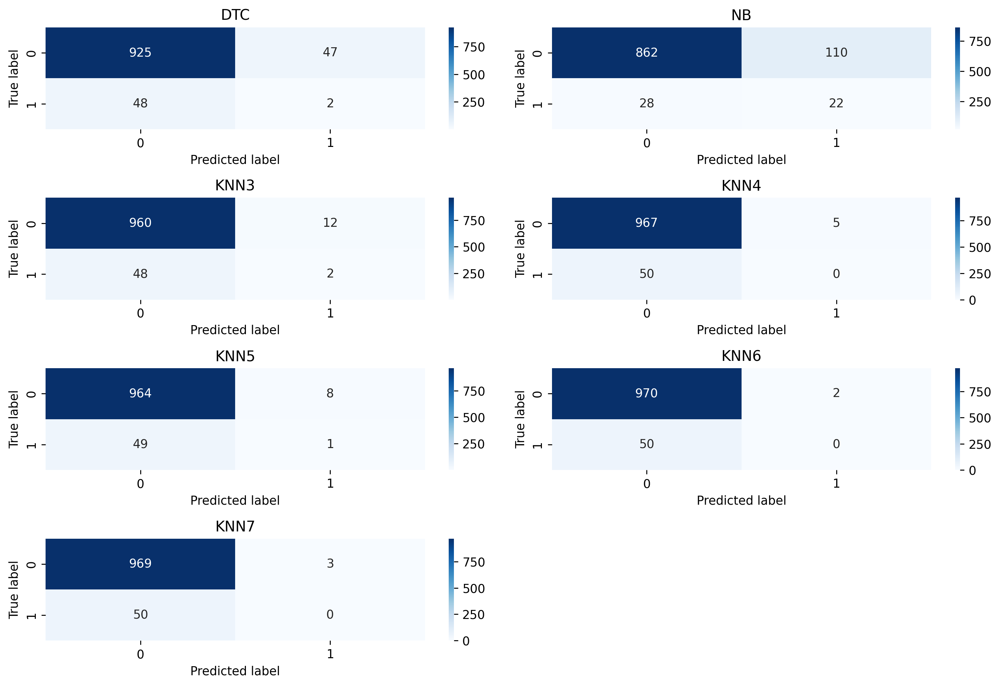

In [161]:
model_accuracy = pd.DataFrame(columns=['Model','Accuracy'])
models = {
  'DTC' : DecisionTreeClassifier(criterion='entropy'),
  "NB": GaussianNB(),       
  'KNN3' : KNeighborsClassifier(n_neighbors=3),
  'KNN4' : KNeighborsClassifier(n_neighbors=4),
  'KNN5' : KNeighborsClassifier(),
  'KNN6' : KNeighborsClassifier(n_neighbors=6),
  'KNN7' : KNeighborsClassifier(n_neighbors=7),
}


num_cols = 2
num_rows = (len(models) + num_cols - 1) // num_cols
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 8))
axes = axes.flatten()

for i,  (test, classifier) in enumerate(models.items()):
  classifier.fit(x_train, y_train)
  y_pred = classifier.predict(x_test)
  acc = accuracy_score(y_test,y_pred)
  train_pred = classifier.predict(x_train)
  train_acc = accuracy_score(y_train, train_pred)
  print( test + ' scores')
  print(acc)
  print(classification_report(y_test, y_pred))
  print(confusion_matrix(y_test, y_pred))
  print('*' * 100)
  model_accuracy = model_accuracy.append({'Model': test, 'Accuracy': acc, 'Train_acc': train_acc}, ignore_index=True)
  cm = confusion_matrix(y_test, y_pred)
    
  sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[i])

  axes[i].set_title(test)
  axes[i].set_xlabel('Predicted label')
  axes[i].set_ylabel('True label')
    
model_accuracy

if len(models) < num_rows * num_cols:
    for j in range(len(models), num_rows * num_cols):
        fig.delaxes(axes[j])

fig.tight_layout()

plt.show()

The accuracy scores are good, ranging from $0.89$ to $0.96$, which seems fine, but when checking the confusion matrices, we find that all models are doing well at predicting Stroke = 0, but on the other hand, the prediction accuracy for Stroke = 1 is mostly around $0.1$ to $0.5$ which is very bad, but it doesn't have much effect on the overall accuracy because the number of test cases for Stroke = 1 is very little relative to the whole dataset.

Let's try classifying after training the models with the SMOTE Oversampled data.

#### 3.2 Oversampled Data

DTC scores
0.9426686960933536
              precision    recall  f1-score   support

           0       0.95      0.93      0.94       907
           1       0.94      0.96      0.95      1064

    accuracy                           0.94      1971
   macro avg       0.94      0.94      0.94      1971
weighted avg       0.94      0.94      0.94      1971

[[ 839   68]
 [  45 1019]]
****************************************************************************************************
NB scores
0.84779299847793
              precision    recall  f1-score   support

           0       0.85      0.82      0.83       907
           1       0.85      0.88      0.86      1064

    accuracy                           0.85      1971
   macro avg       0.85      0.85      0.85      1971
weighted avg       0.85      0.85      0.85      1971

[[740 167]
 [133 931]]
****************************************************************************************************
KNN3 scores
0.976154236428209
       

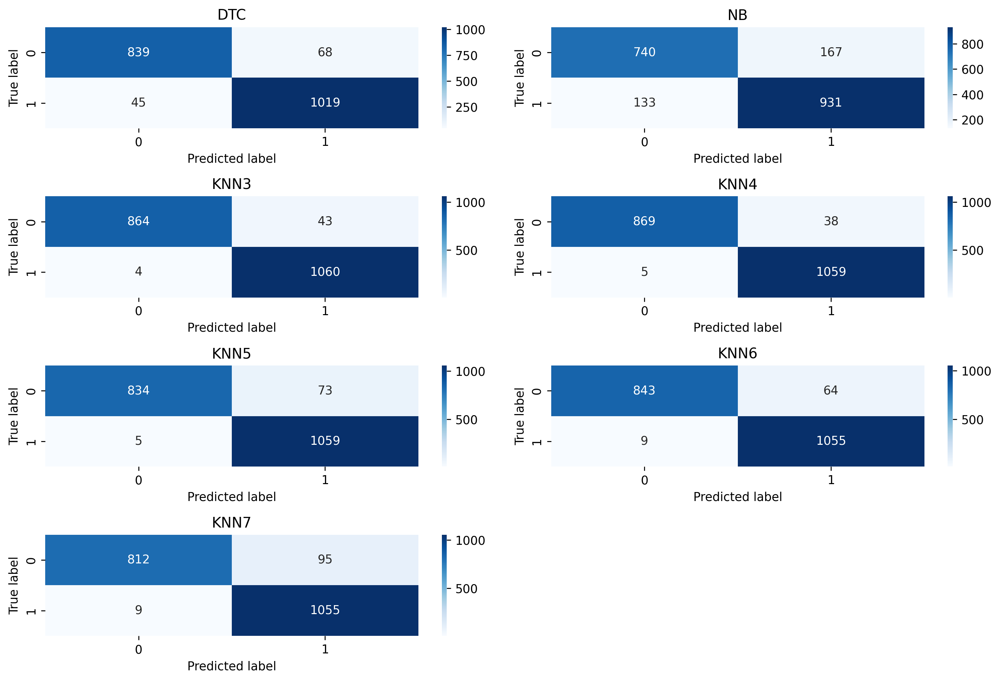

In [162]:
# oversampled data ML
model_accuracy = pd.DataFrame(columns=['Model','Accuracy'])
models = {
  'DTC' : DecisionTreeClassifier(criterion='entropy'),
  "NB": GaussianNB(),       
  'KNN3' : KNeighborsClassifier(n_neighbors=3),
  'KNN4' : KNeighborsClassifier(n_neighbors=4),
  'KNN5' : KNeighborsClassifier(),
  'KNN6' : KNeighborsClassifier(n_neighbors=6),
  'KNN7' : KNeighborsClassifier(n_neighbors=7),
}

num_cols = 2
num_rows = (len(models) + num_cols - 1) // num_cols
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 8))
axes = axes.flatten()

for i, (test, classifier) in enumerate(models.items()):
  classifier.fit(resX_train, resy_train)
  y_pred = classifier.predict(resX_test)
  acc = accuracy_score(resy_test,y_pred)
  train_pred = classifier.predict(resX_train)
  train_acc = accuracy_score(resy_train, train_pred)
  print( test + ' scores')
  print(acc)
  print(classification_report(resy_test,y_pred))
  print(confusion_matrix(resy_test,y_pred))
  print('*' * 100)
  model_accuracy = model_accuracy.append({'Model': test, 'Accuracy': acc, 'Train_acc': train_acc}, ignore_index=True)
  
  cm = confusion_matrix(resy_test, y_pred)

  sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[i])

  axes[i].set_title(test)
  axes[i].set_xlabel('Predicted label')
  axes[i].set_ylabel('True label')
  
model_accuracy

if len(models) < num_rows * num_cols:
    for j in range(len(models), num_rows * num_cols):
        fig.delaxes(axes[j])
        
        
fig.tight_layout()

plt.show()

After using machine learning classifiers on raw data and SMOTE oversampled data, we see significant improvement in the confusion matrices of each model, especially for labeling Stroke = 1. The SMOTE oversampling technique helped to address the imbalanced nature of the dataset, allowing the classifier to learn from a more balanced representation of both the positive and negative classes. As a result, the classifier became better equipped to correctly identify positive instances, reducing false negatives and improving overall predictive accuracy.

#### 4. Visualization for each classification algorithm

##### 4.1 Decision tree

In [163]:
mpl.rcParams['figure.dpi'] = 120

classifier = DecisionTreeClassifier(criterion='entropy')
classifier.fit(resX_train, resy_train)

plt.figure(figsize=(200,100))
plot_tree(classifier, feature_names=list(resX_train.columns),  filled=True)
plt.show()

##### 4.2 Bayes Classifier

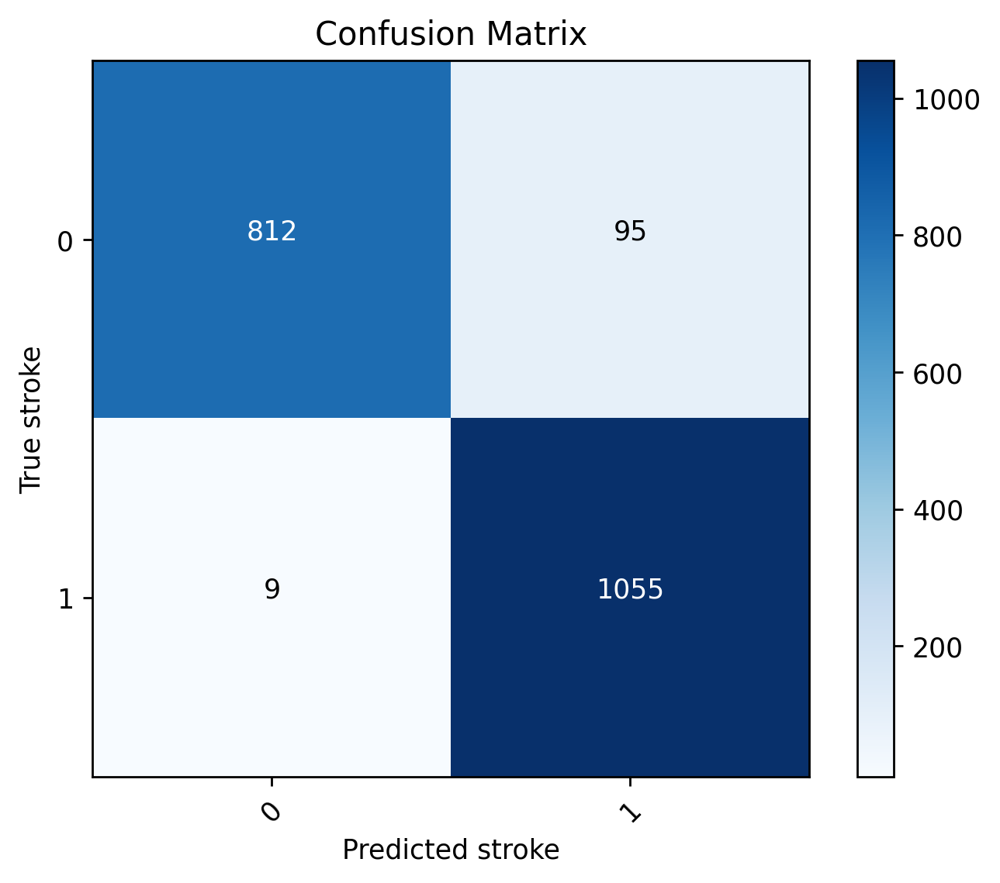

In [164]:
mpl.rcParams['figure.dpi'] = 250

classifier = GaussianNB()
classifier.fit(resX_train, resy_train)
cm = confusion_matrix(resy_test, y_pred)

# Plotting the confusion matrix
classes = [0, 1]
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.colorbar(cmap = 'Blues')
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)
plt.xlabel('Predicted stroke')
plt.ylabel('True stroke')
plt.title('Confusion Matrix')

thresh = cm.max() / 2.0
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

plt.show()

##### Visualizing using Bayesian classifier using ROC

The ROC curve graph visualizes the performance of a binary classifier for stroke prediction. The curve plots the True Positive Rate (TPR) against the False Positive Rate (FPR) for various probability thresholds. A good classifier is characterized by a curve that closely follows the upper-left corner, indicating high TPR and low FPR.

The Area Under the Curve (AUC) score is a measure of overall classifier performance, with a higher score indicating better accuracy.

In this graph, the blue line represents the ROC curve, with the associated AUC value displayed in the legend. The black dashed line represents a random classifier, providing a baseline for comparison.

Each scatter point on the curve corresponds to a specific probability threshold, with color intensity ranging from light sky blue ($-0.1$) to dark navy blue ($+0.1$), representing the threshold values.

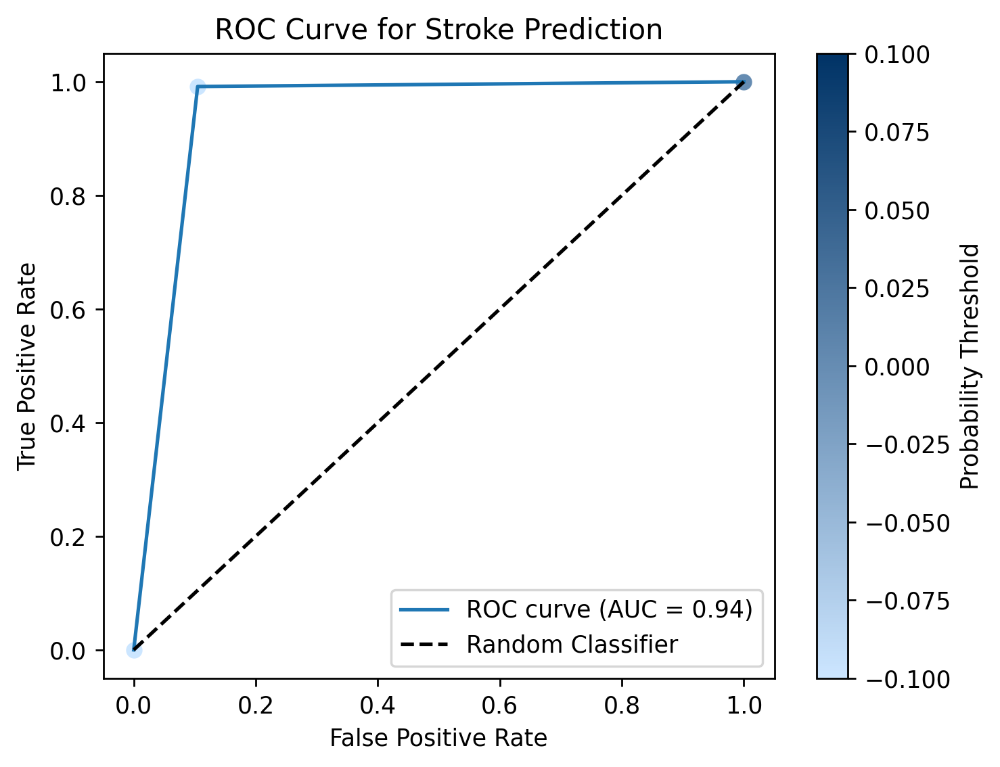

In [165]:
fpr, tpr, threshold = roc_curve(resy_test, y_pred)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')
plt.title('ROC Curve for Stroke Prediction')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')

colors = [(0.8, 0.9, 1.0), (0.0, 0.2, 0.4)]
cmap = LinearSegmentedColormap.from_list('map', colors)
for i, th in enumerate(threshold):
    plt.scatter(fpr[i], tpr[i], c=th, cmap=cmap)

plt.colorbar(label='Probability Threshold')
plt.show()

##### K Nearest Negihbour

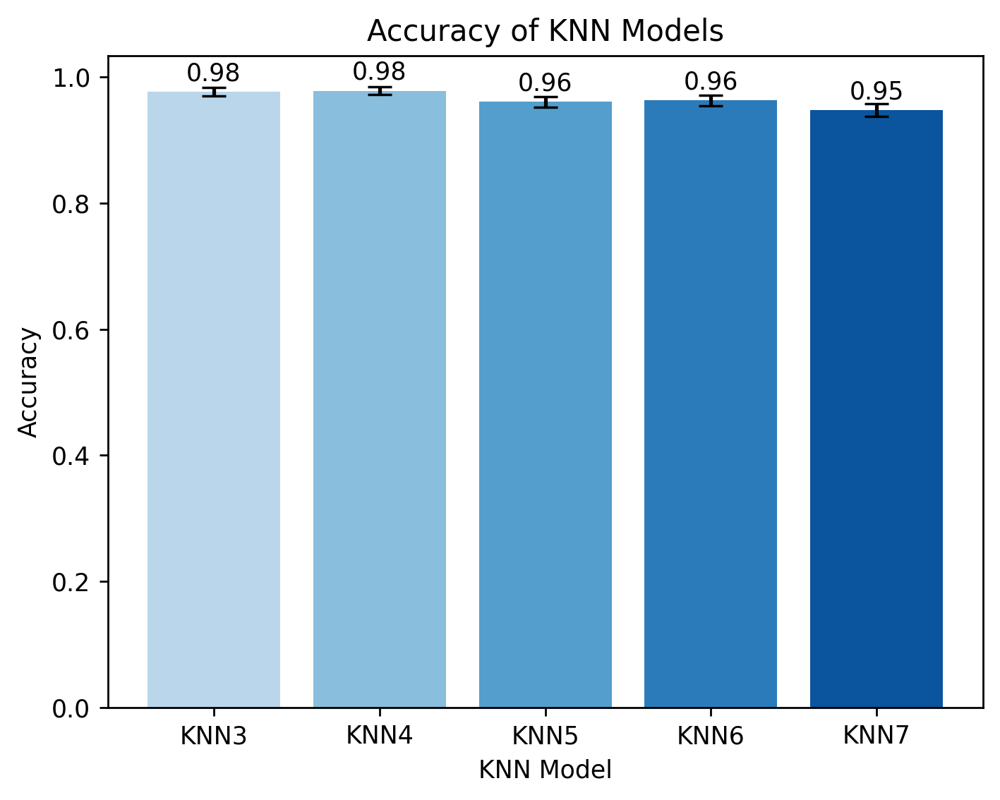

In [168]:
colors = sns.color_palette("Blues")[1:]
plt.bar(model_accuracy['Model'][2:], model_accuracy['Accuracy'][2:], color=colors)
plt.errorbar(model_accuracy['Model'][2:], model_accuracy['Accuracy'][2:], yerr=(1.96 * np.sqrt(model_accuracy['Accuracy'][2:] * (1 - model_accuracy['Accuracy'][2:]) / len(resy_test))), fmt='none', color='black', capsize=5)
plt.xlabel('KNN Model')
plt.ylabel('Accuracy')
plt.title('Accuracy of KNN Models')

for i, acc in enumerate(model_accuracy['Accuracy'][2:]):
    plt.text(i, acc + 0.01, f'{acc:.2f}', ha='center', va='bottom')

plt.show()

#### Conclusion:
In this project, we aimed to develop an effective classification model to predict strokes based on a given dataset. We started by thoroughly pre-processing the data to ensure its quality and suitability for analysis. The pre-processing phase involved understanding the data and handling missing values through the use of the most frequent approach and Bayesian ridge regression for prediction. We also performed outlier detection, followed by an analysis that revealed the importance of keeping outliers in our dataset.

To prepare the data for classification, we performed continuous feature discretization and normalized the discretized features. Moreover, we examined the correlations between the features using the Pearson correlation matrix, which provided insights into the relationships within the data.

For classification purposes, we employed several machine learning algorithms, including the decision tree classifier, K-nearest neighbors (KNN) classifier, and Naive Bayes. To address the challenge of imbalanced data, we utilized the SMOTE oversampling technique, which effectively increased the representation of the minority class. We evaluated the performance of each classifier on both the original and oversampled datasets.

Through our experiments, we found that the SMOTE oversampling technique significantly improved the accuracy of the classifiers, particularly for positive stroke prediction. The decision tree classifier, KNN classifier, and Naive Bayes all demonstrated promising performance in predicting strokes.

In conclusion, this project highlighted the importance of comprehensive data preprocessing techniques and the significance of addressing imbalanced datasets when developing classification models. The successful application of SMOTE oversampling demonstrated its effectiveness in improving the performance of classifiers on imbalanced binary datasets. The insights gained from feature analysis, correlations, and model accuracies provide valuable knowledge for future studies in stroke prediction.
